In [1]:
import sys

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import collections
import scanpy as sc
import scvi

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

from datetime import date
today = str(date.today())

import matplotlib
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')

# %cd /nfs/team205/vk8/processed_data/muscle/data_v3

results = './write/'

Global seed set to 0
/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
general_mrkrs = [ 'MYH7', 'TNNT1', 'TNNT3', 'MYH1', 'MYH2', "CKM", "MB", # Myofibers
           'PAX7', 'DLK1', # MuSCs
           'PDGFRA', 'DCN', 'ANGPTL7', 'OSR2', 'NGFR', 'SLC22A3','ITGA6', # Fibroblasts
           'FMOD', 'TNMD' ,  'MKX', # Tenocytes
 'MPZ', 'MBP',  # Schwann cells
'CDH2', 'L1CAM', # SCG
'MSLN', 'ITLN1', # mesothelium
"ADIPOQ", "PLIN1", # adipocytes
'PTPRC', 'CD3D', 'IL7R', # T cells
'NKG7', 'PRF1', #NK cells
'CD79A', "TCL1A",  # B cells
'MZB1', 'JCHAIN', # B plasma 
"CD14", "FCGR3A",'S100A8', 'S100A12', # Mono
"CD163", "C1QA", # Macrop
"XCR1", "CLEC9A", # cDC1 "CADM1",
"CD1C", "CLEC10A", "CCR7", # cDC2
'LILRA4', 'IL3RA', "IRF7",  # pDC 
'FCGR3B', 'CSF3R', 'SORL1',  # Neutrophils
'EPX', 'PRG2', # Eosinophils 'CLC'
'TPSB2', 'MS4A2', # Mast cells
'PECAM1', 'HEY1','CLU', # art EC
'CA4', 'LPL', # capEC
'ACKR1', 'SELE', # venEC
'LYVE1', 'TFF3',  # lymphEC
'RGS5','ABCC9', # pericytes           
'MYH11', 'ACTA2', # SMC
'HBA1', #RBC
    ]

In [3]:
adata_sc = sc.read(f'{results}/ICM_scell_dbrm_scvi_v2_2023-03-06.h5ad')

In [4]:
list1 = adata_sc[adata_sc.obs['coarse_majority_voting']=='MF_typeI(fg)'].obs.index
list2 = adata_sc[adata_sc.obs['coarse_majority_voting']=='MF_typeII(fg)'].obs.index
list3 = adata_sc[adata_sc.obs['coarse_majority_voting']=='Specialised_MF_populations'].obs.index

list_all = list1.append(list2).append(list3)

In [5]:
adata = adata_sc[list_all]

In [6]:
adata

View of AnnData object with n_obs × n_vars = 12896 × 33538
    obs: 'SampleID', 'barcode', 'concat_sample_no', 'DonorID', 'Sex', 'Age', 'Species', 'Operator', 'Sample', '10X_version', 'n_counts', 'n_counts_raw', 'percent_soup', 'n_counts_spliced', 'n_counts_unspliced', 'percent_spliced', 'n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'Age_group', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'is_doublet_scrub', 'annotation_level0', 'annotation_level1', 'annotation_level2', 'sample_type', 'update_status', 'putative_doublet_scvi1', '_scvi_batch', '_scvi_labels', 'leiden', 'coarse_predicted_labels', 'coarse_over_clustering', 'coarse_majority_voting', 'coarse_conf_score', 'fine_predicted_labels', 'fine_over_clustering', 'fine_majority_voting', 'fine_conf_score', 'fine2_predicted_labels', 'fine2_over_clustering', 'fine2_majority_voting', 'fine2_conf_score'
    var: 'ENSEMBL', 'SYMBOL', 'n_counts', 'n_cells', 'mean', 'std'
   

In [7]:
adata.write('./write/ICM_MF_scvi_adata_raw_test.h5ad')

In [8]:
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata  # keep full dimension safe

In [9]:
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=10000, layer="counts",batch_key='Age_group', subset = True)

scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key='SampleID',
                              categorical_covariate_keys=["DonorID", "Sex", "10X_version"],
                              continuous_covariate_keys=['percent_mito'])

vae = scvi.model.SCVI(adata,n_hidden=128, n_latent=30, n_layers=2)
vae.train()
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.leiden(adata)
sc.tl.umap(adata)

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/torch/cuda/__init__.py:88: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0
/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


Epoch 400/400: 100%|██████████| 400/400 [36:58<00:00,  6.05s/it, loss=1.4e+03, v_num=1] 

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [36:58<00:00,  5.55s/it, loss=1.4e+03, v_num=1]


In [10]:
adata

AnnData object with n_obs × n_vars = 12896 × 10000
    obs: 'SampleID', 'barcode', 'concat_sample_no', 'DonorID', 'Sex', 'Age', 'Species', 'Operator', 'Sample', '10X_version', 'n_counts', 'n_counts_raw', 'percent_soup', 'n_counts_spliced', 'n_counts_unspliced', 'percent_spliced', 'n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'Age_group', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'is_doublet_scrub', 'annotation_level0', 'annotation_level1', 'annotation_level2', 'sample_type', 'update_status', 'putative_doublet_scvi1', '_scvi_batch', '_scvi_labels', 'leiden', 'coarse_predicted_labels', 'coarse_over_clustering', 'coarse_majority_voting', 'coarse_conf_score', 'fine_predicted_labels', 'fine_over_clustering', 'fine_majority_voting', 'fine_conf_score', 'fine2_predicted_labels', 'fine2_over_clustering', 'fine2_majority_voting', 'fine2_conf_score'
    var: 'ENSEMBL', 'SYMBOL', 'n_counts', 'n_cells', 'mean', 'std', 'highly_va

In [34]:
adata.write('./write/ICM_MF_scvi_adata.h5ad')

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


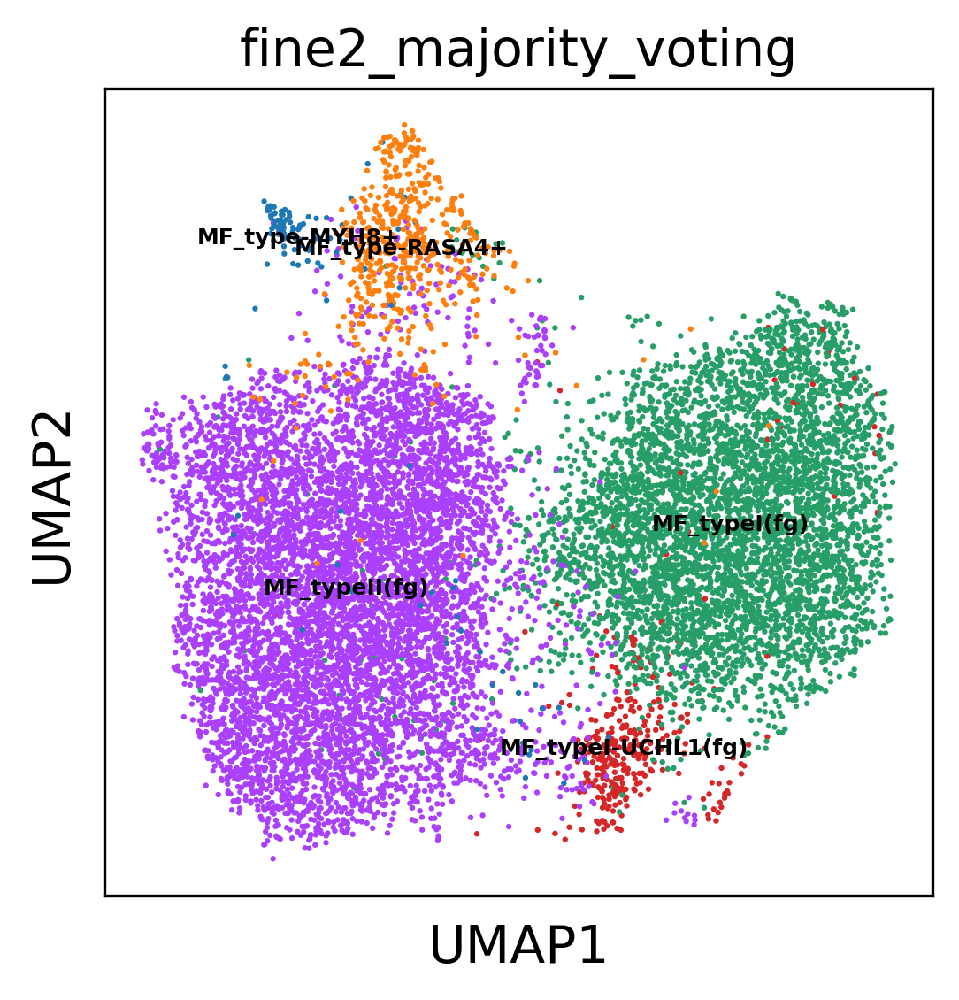

In [3]:
sc.pl.umap(adata, color = ['fine2_majority_voting',],legend_loc='on data',legend_fontsize=6 )

In [2]:
adata = sc.read('./write/ICM_MF_scvi_adata.h5ad')

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


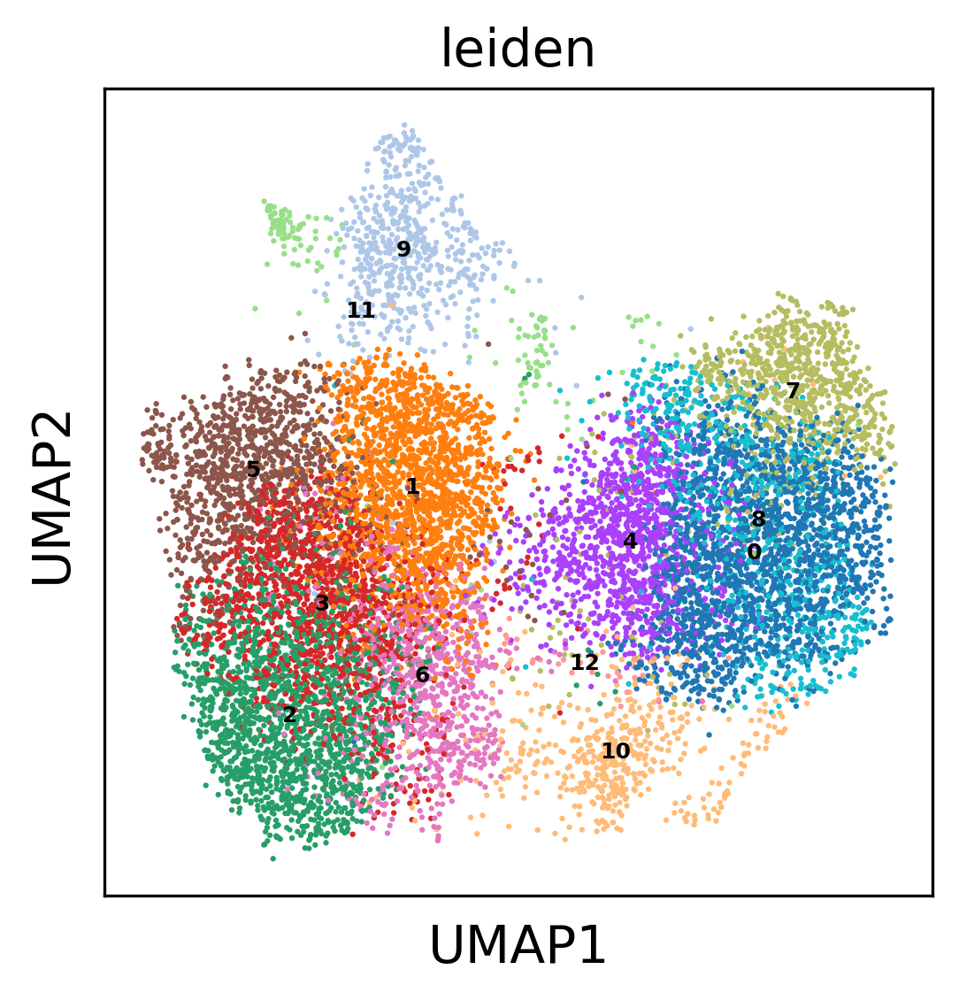

In [3]:
sc.pl.umap(adata, color = ['leiden',],legend_loc='on data',legend_fontsize=6 )

In [4]:
adata

AnnData object with n_obs × n_vars = 12896 × 10000
    obs: 'SampleID', 'barcode', 'concat_sample_no', 'DonorID', 'Sex', 'Age', 'Species', 'Operator', 'Sample', '10X_version', 'n_counts', 'n_counts_raw', 'percent_soup', 'n_counts_spliced', 'n_counts_unspliced', 'percent_spliced', 'n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'Age_group', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'is_doublet_scrub', 'annotation_level0', 'annotation_level1', 'annotation_level2', 'sample_type', 'update_status', 'putative_doublet_scvi1', '_scvi_batch', '_scvi_labels', 'leiden', 'coarse_predicted_labels', 'coarse_over_clustering', 'coarse_majority_voting', 'coarse_conf_score', 'fine_predicted_labels', 'fine_over_clustering', 'fine_majority_voting', 'fine_conf_score', 'fine2_predicted_labels', 'fine2_over_clustering', 'fine2_majority_voting', 'fine2_conf_score'
    var: 'ENSEMBL', 'SYMBOL', 'n_counts', 'n_cells', 'mean', 'std', 'highly_va

In [6]:
adata

AnnData object with n_obs × n_vars = 12896 × 10000
    obs: 'SampleID', 'barcode', 'concat_sample_no', 'DonorID', 'Sex', 'Age', 'Species', 'Operator', 'Sample', '10X_version', 'n_counts', 'n_counts_raw', 'percent_soup', 'n_counts_spliced', 'n_counts_unspliced', 'percent_spliced', 'n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'Age_group', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'is_doublet_scrub', 'annotation_level0', 'annotation_level1', 'annotation_level2', 'sample_type', 'update_status', 'putative_doublet_scvi1', '_scvi_batch', '_scvi_labels', 'leiden', 'coarse_predicted_labels', 'coarse_over_clustering', 'coarse_majority_voting', 'coarse_conf_score', 'fine_predicted_labels', 'fine_over_clustering', 'fine_majority_voting', 'fine_conf_score', 'fine2_predicted_labels', 'fine2_over_clustering', 'fine2_majority_voting', 'fine2_conf_score'
    var: 'ENSEMBL', 'SYMBOL', 'n_counts', 'n_cells', 'mean', 'std', 'highly_va

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


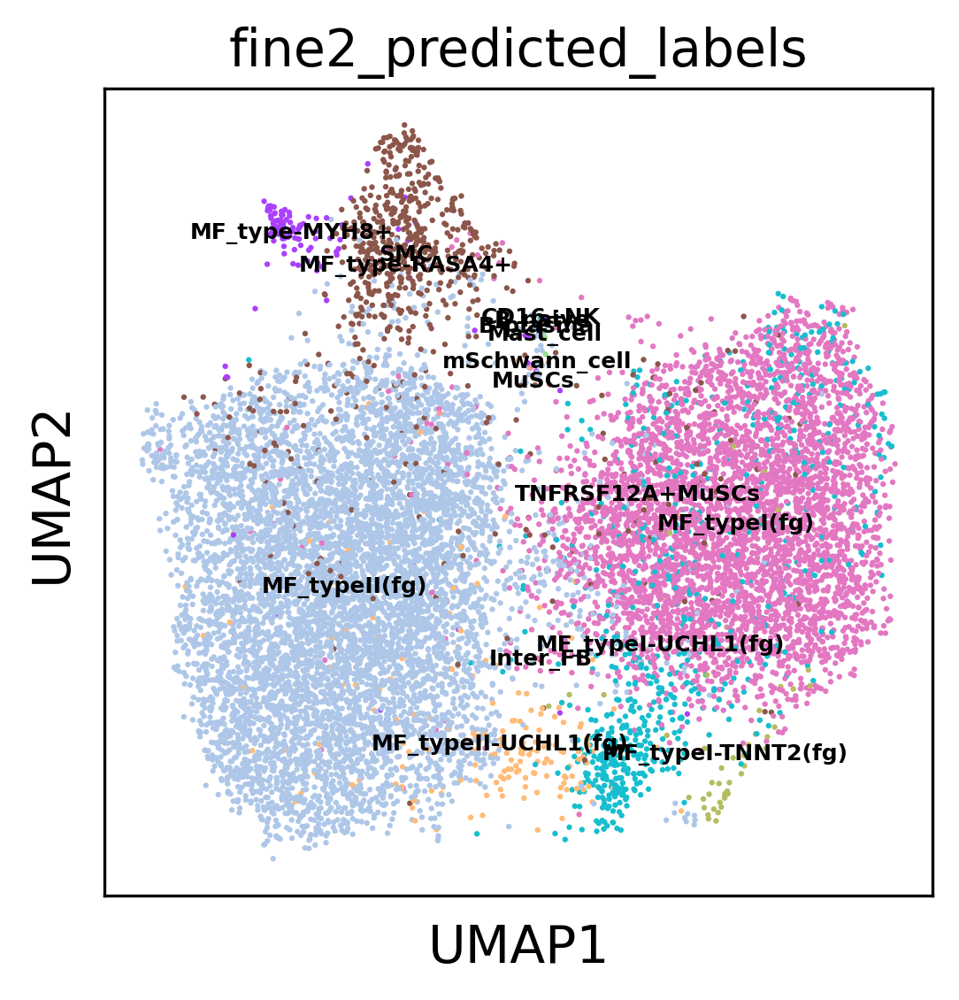

In [22]:
sc.pl.umap(adata, color = ['fine2_predicted_labels',],legend_loc='on data',legend_fontsize=6 )

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


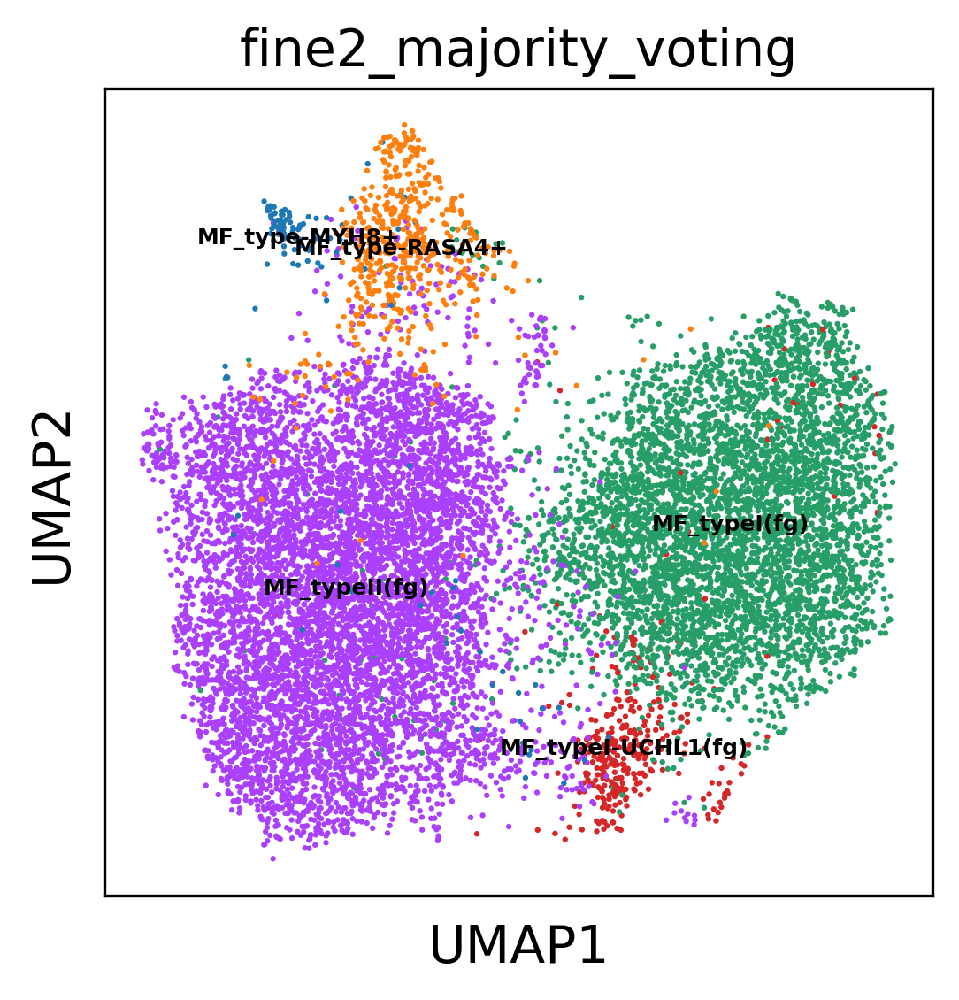

In [26]:
sc.pl.umap(adata, color = ['fine2_majority_voting',],legend_loc='on data',legend_fontsize=6 )

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


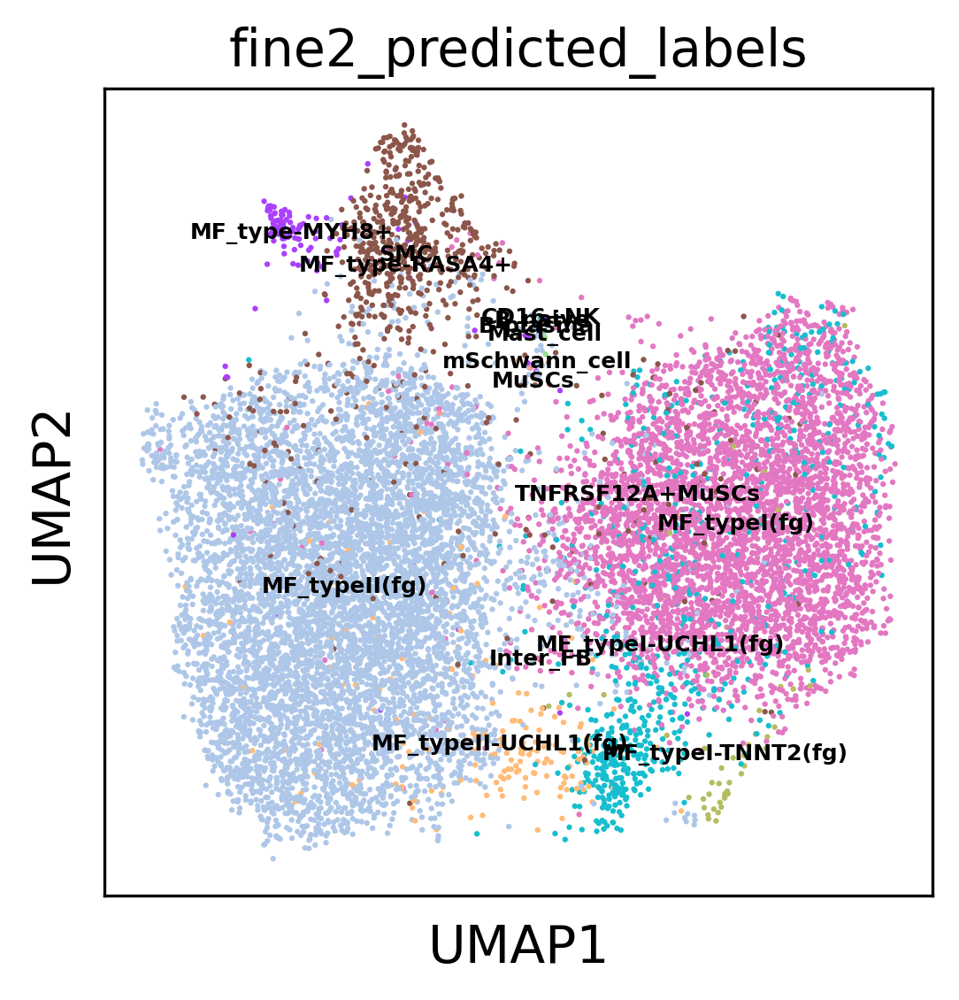

In [9]:
sc.pl.umap(adata, color = ['fine2_predicted_labels',],legend_loc='on data',legend_fontsize=6 )

In [27]:
collections.Counter(adata.obs['fine2_predicted_labels'])

Counter({'MF_typeI(fg)': 4309,
         'MF_type-RASA4+': 681,
         'MF_typeI-UCHL1(fg)': 689,
         'mSchwann_cell': 1,
         'MF_typeII(fg)': 6857,
         'B_naive': 1,
         'MF_typeI-TNNT2(fg)': 48,
         'MF_typeII-UCHL1(fg)': 190,
         'MF_type-MYH8+': 106,
         'TNFRSF12A+MuSCs': 2,
         'Inter_FB': 1,
         'B-plasma': 1,
         'MuSCs': 4,
         'SMC': 1,
         'Mast_cell': 4,
         'CD16+NK': 1})

In [30]:
adata.obs['annotation_fin'] = adata.obs.apply(lambda x: 'MF_typeI-TNNT2(fg)' if x['fine2_predicted_labels'] in ['MF_typeI-TNNT2(fg)'] else
                                                         'MF_typeII-UCHL1(fg)' if x['fine2_predicted_labels'] in ['MF_typeII-UCHL1(fg)'] else
                                              x['fine2_majority_voting'] , axis =1)

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


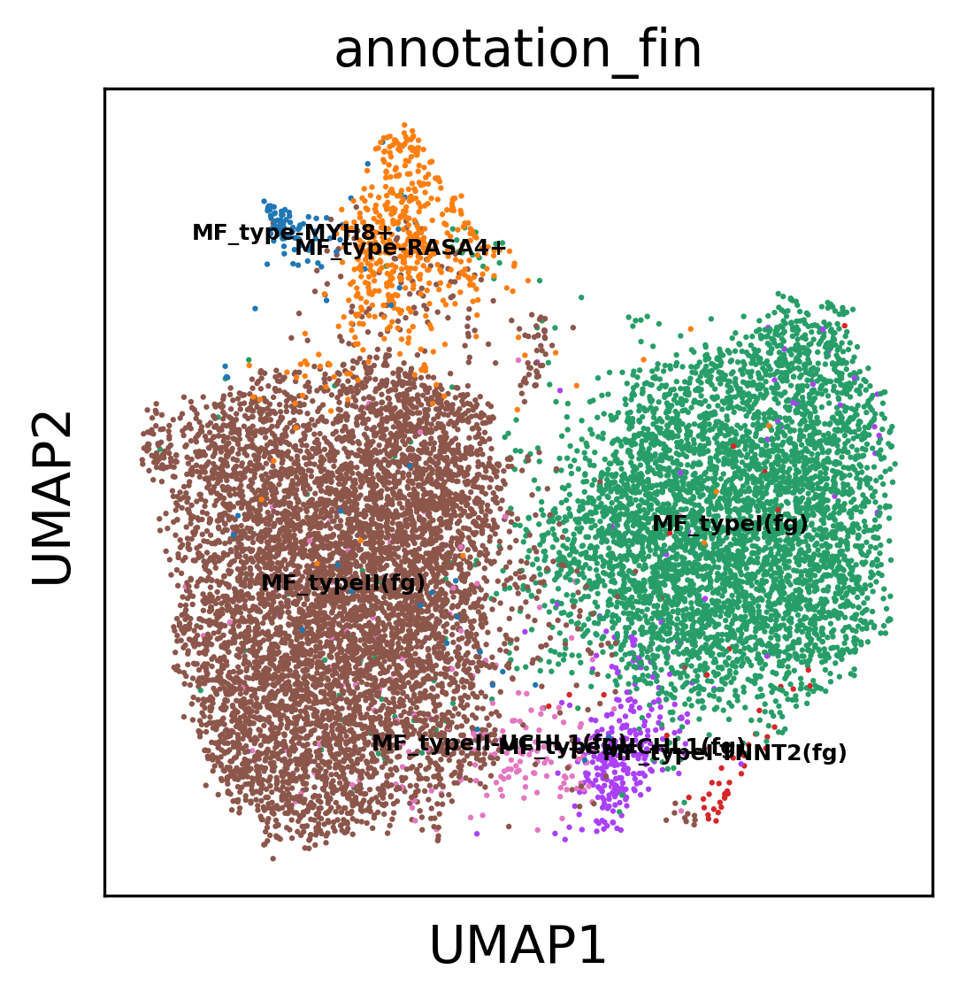

In [31]:
sc.pl.umap(adata, color = ['annotation_fin',],legend_loc='on data',legend_fontsize=6 )

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


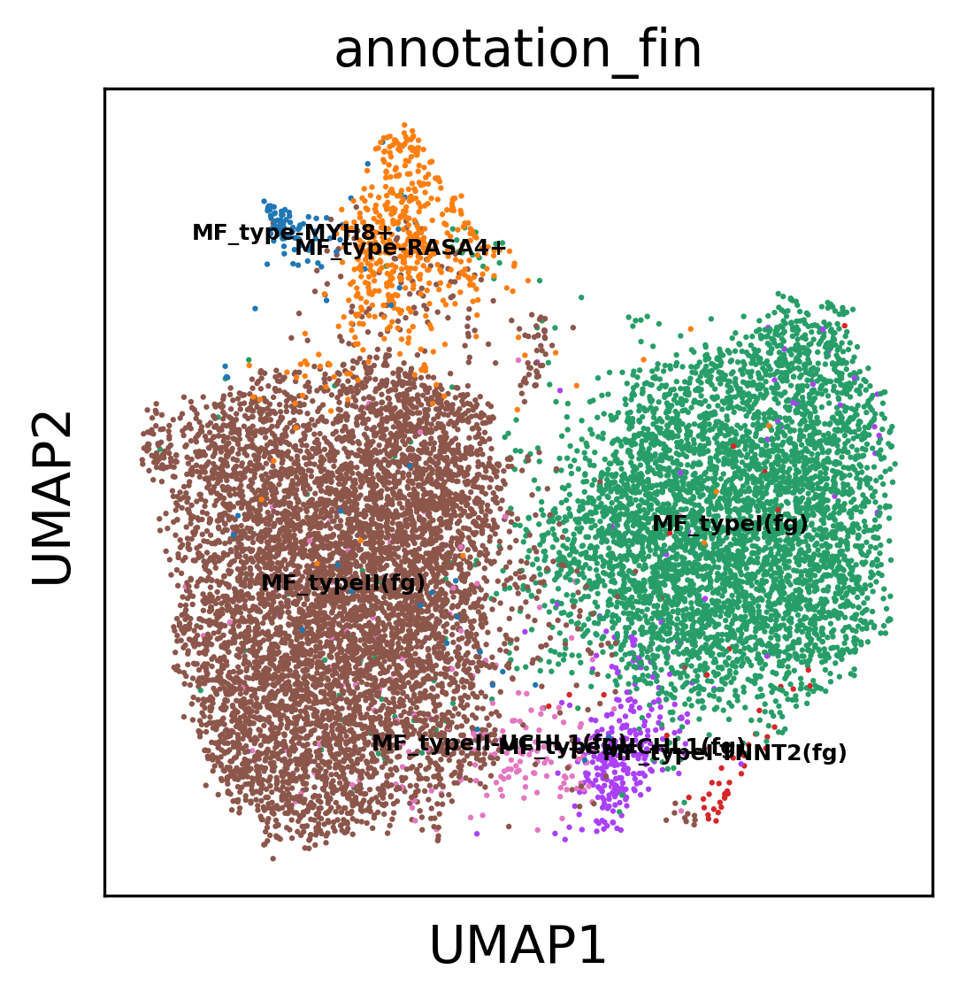

In [4]:
sc.pl.umap(adata, color = ['annotation_fin',],legend_loc='on data',legend_fontsize=6 )

In [46]:
adata.obs['celltype_donorid'] = np.array(adata.obs['annotation_fin'])+'-' + np.array(adata.obs['DonorID'])+'-' + np.array(adata.obs['Age_group'])

group_list = []
means_score = []
cell_type = []
age_group = []
donor_list = []
for i in list(collections.Counter(adata.obs['celltype_donorid']).keys()):
    group_list.append(i)
    means_score.append(np.mean(adata[adata.obs['celltype_donorid']==i].obs['score']))
    cell_type.append(list(collections.Counter(adata[adata.obs['celltype_donorid']==i].obs['annotation_fin']).keys())[0])
    age_group.append(list(collections.Counter(adata[adata.obs['celltype_donorid']==i].obs['Age_group']).keys())[0])
    donor_list.append(list(collections.Counter(adata[adata.obs['celltype_donorid']==i].obs['DonorID']).keys())[0])

KeyError: 'score'

In [49]:
ctype_pct2sample = pd.crosstab(adata.obs['annotation_fin'], [adata.obs['Age'], adata.obs['DonorID'],adata.obs['SampleID']])/(pd.crosstab(adata.obs['annotation_fin'], [adata.obs['Age'],adata.obs['DonorID'], adata.obs['SampleID']]).sum(0))
ctype_pct2sample = ctype_pct2sample.T.groupby(level = ['Age','DonorID']).mean().dropna()
ctype_pct2sample.style.background_gradient(cmap='viridis')

,annotation_fin,MF_type-MYH8+,MF_type-RASA4+,MF_typeI(fg),MF_typeI-TNNT2(fg),MF_typeI-UCHL1(fg),MF_typeII(fg),MF_typeII-UCHL1(fg)
Age,DonorID,,,,,,,
19,470BR,0.018519,0.031676,0.039474,0.000000,0.000000,0.870858,0.039474
28,583B,0.001354,0.000647,0.520988,0.022251,0.006123,0.438572,0.010065
29,411C,0.000000,0.000000,0.937500,0.062500,0.000000,0.000000,0.000000
35,464C,0.000000,0.000000,0.333333,0.000000,0.000000,0.555556,0.111111
38,591C,0.001050,0.001364,0.543969,0.002101,0.148468,0.238534,0.064514
50,621B,0.000334,0.002027,0.294314,0.000787,0.000000,0.699270,0.003268
58,582C,0.002450,0.017230,0.377628,0.000000,0.014263,0.569208,0.019220
60,362C,0.002513,0.008097,0.673133,0.000000,0.075173,0.232987,0.008097
70,343B,0.035857,0.029880,0.535857,0.000000,0.023904,0.350598,0.023904


In [53]:
ctype_pct2sample = pd.crosstab(adata.obs['annotation_fin'], [adata.obs['Sex'], adata.obs['DonorID'],adata.obs['SampleID']])/(pd.crosstab(adata.obs['annotation_fin'], [adata.obs['Sex'],adata.obs['DonorID'], adata.obs['SampleID']]).sum(0))
ctype_pct2sample = ctype_pct2sample.T.groupby(level = ['Sex','DonorID']).mean().dropna()
ctype_pct2sample.style.background_gradient(cmap='viridis')

In [50]:
adata

AnnData object with n_obs × n_vars = 12896 × 10000
    obs: 'SampleID', 'barcode', 'concat_sample_no', 'DonorID', 'Sex', 'Age', 'Species', 'Operator', 'Sample', '10X_version', 'n_counts', 'n_counts_raw', 'percent_soup', 'n_counts_spliced', 'n_counts_unspliced', 'percent_spliced', 'n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'Age_group', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'is_doublet_scrub', 'annotation_level0', 'annotation_level1', 'annotation_level2', 'sample_type', 'update_status', 'putative_doublet_scvi1', '_scvi_batch', '_scvi_labels', 'leiden', 'coarse_predicted_labels', 'coarse_over_clustering', 'coarse_majority_voting', 'coarse_conf_score', 'fine_predicted_labels', 'fine_over_clustering', 'fine_majority_voting', 'fine_conf_score', 'fine2_predicted_labels', 'fine2_over_clustering', 'fine2_majority_voting', 'fine2_conf_score', 'annotation_fin', 'celltype_donorid'
    var: 'ENSEMBL', 'SYMBOL', 'n_counts'

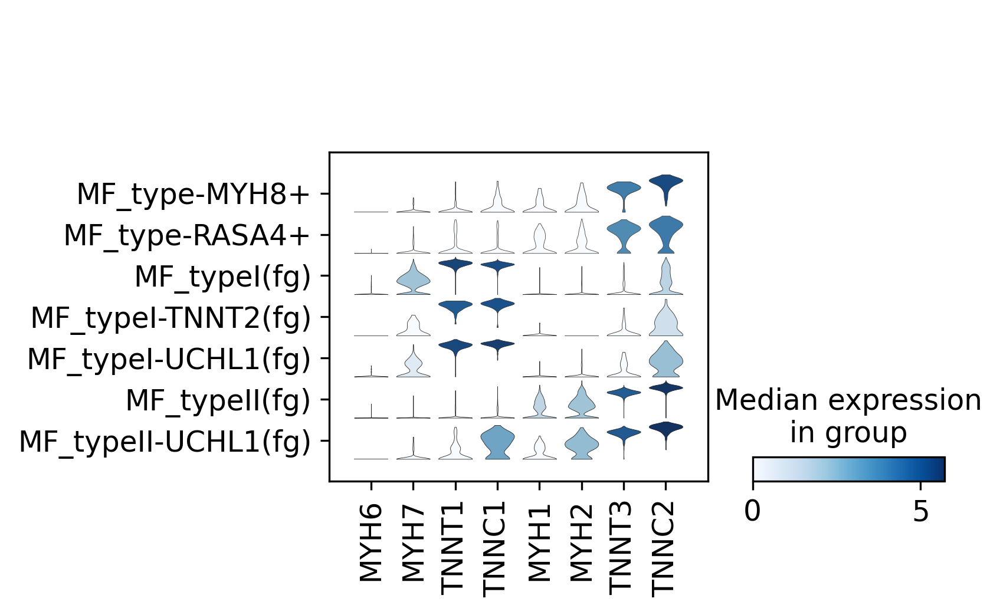

In [5]:
sc.pl.stacked_violin(adata,['MYH6','MYH7','TNNT1','TNNC1','MYH1','MYH2','TNNT3','TNNC2',],groupby='annotation_fin',
                    )

In [7]:
adata_myh8 = adata[adata.obs['annotation_fin']=='MF_type-MYH8+']

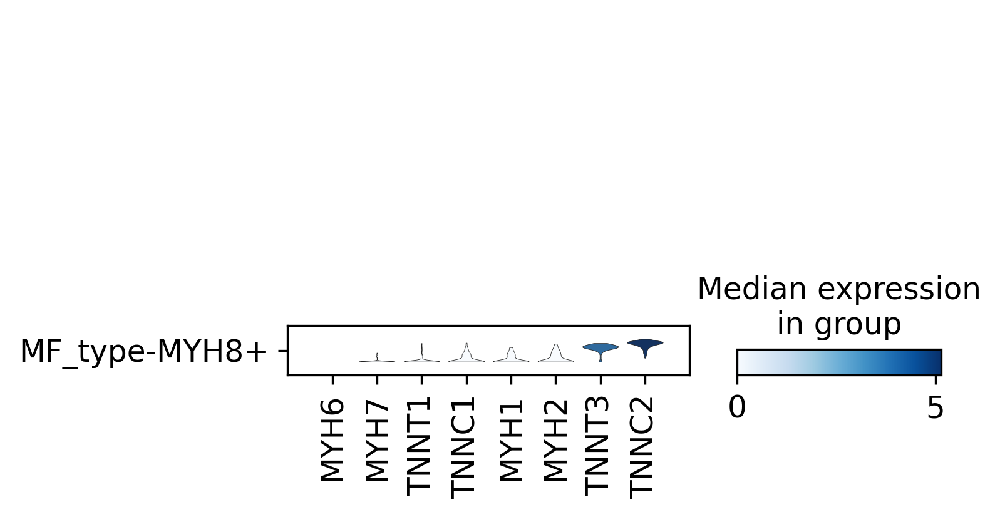

In [45]:
sc.pl.stacked_violin(adata_myh8,['MYH6','MYH7','TNNT1','TNNC1','MYH1','MYH2','TNNT3','TNNC2',],groupby='annotation_fin',
                    save='ICM_MF_scvi_myh8.pdf')`

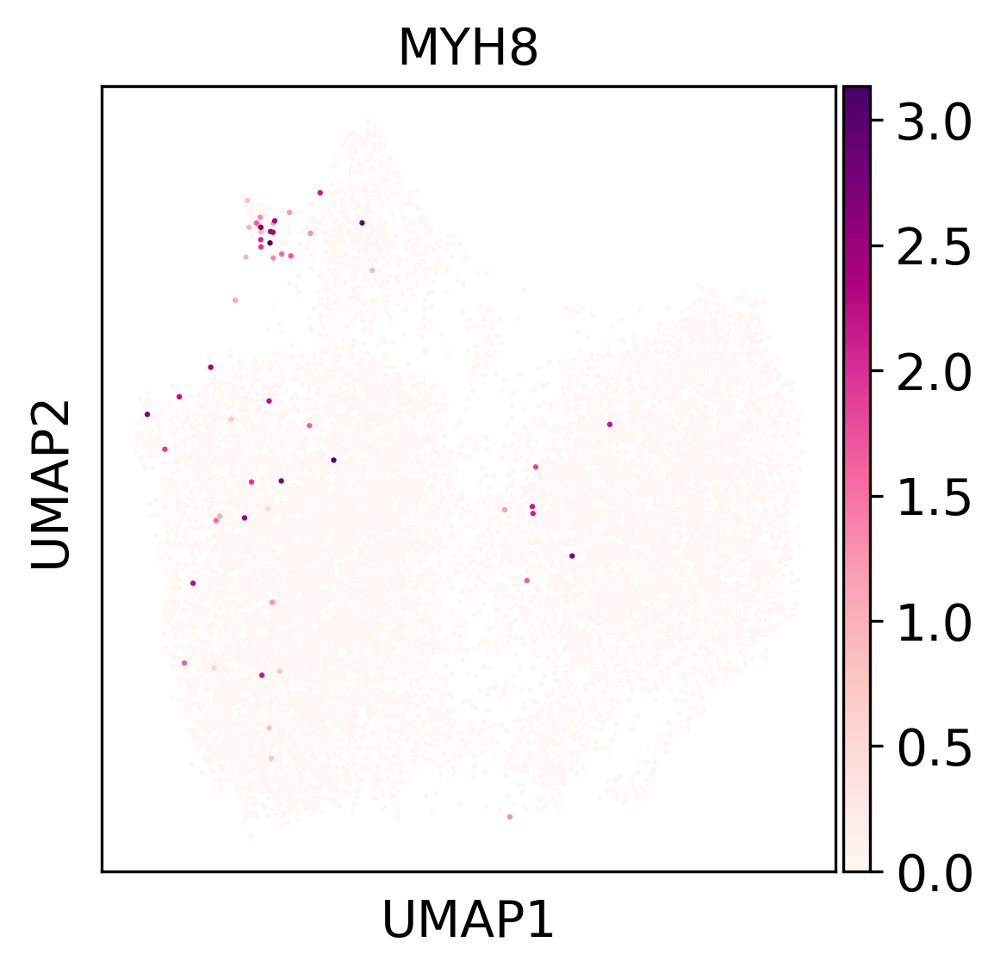

In [35]:
sc.pl.umap(adata, color = ['MYH8',],legend_loc='on data',legend_fontsize=6 )

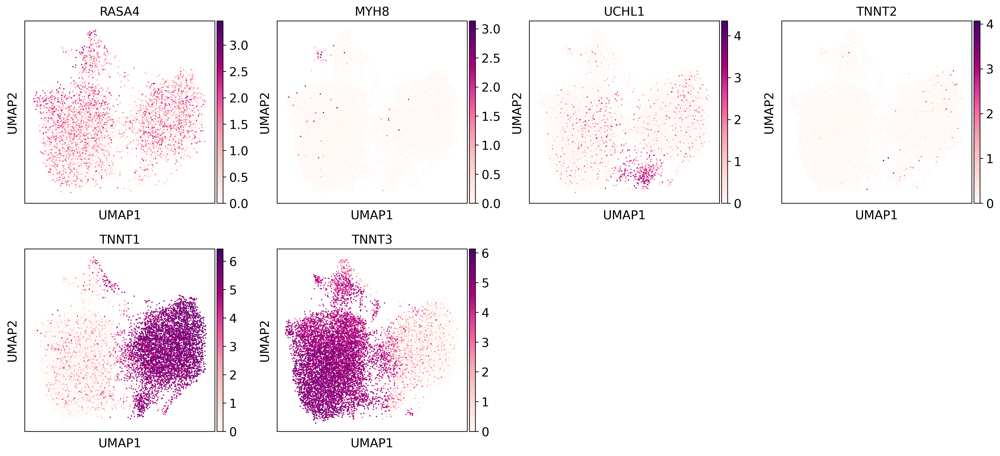

In [23]:
sc.pl.umap(adata, color = ['RASA4','MYH8','UCHL1','TNNT2','TNNT1','TNNT3'], legend_loc = "on data", legend_fontsize = 5)

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


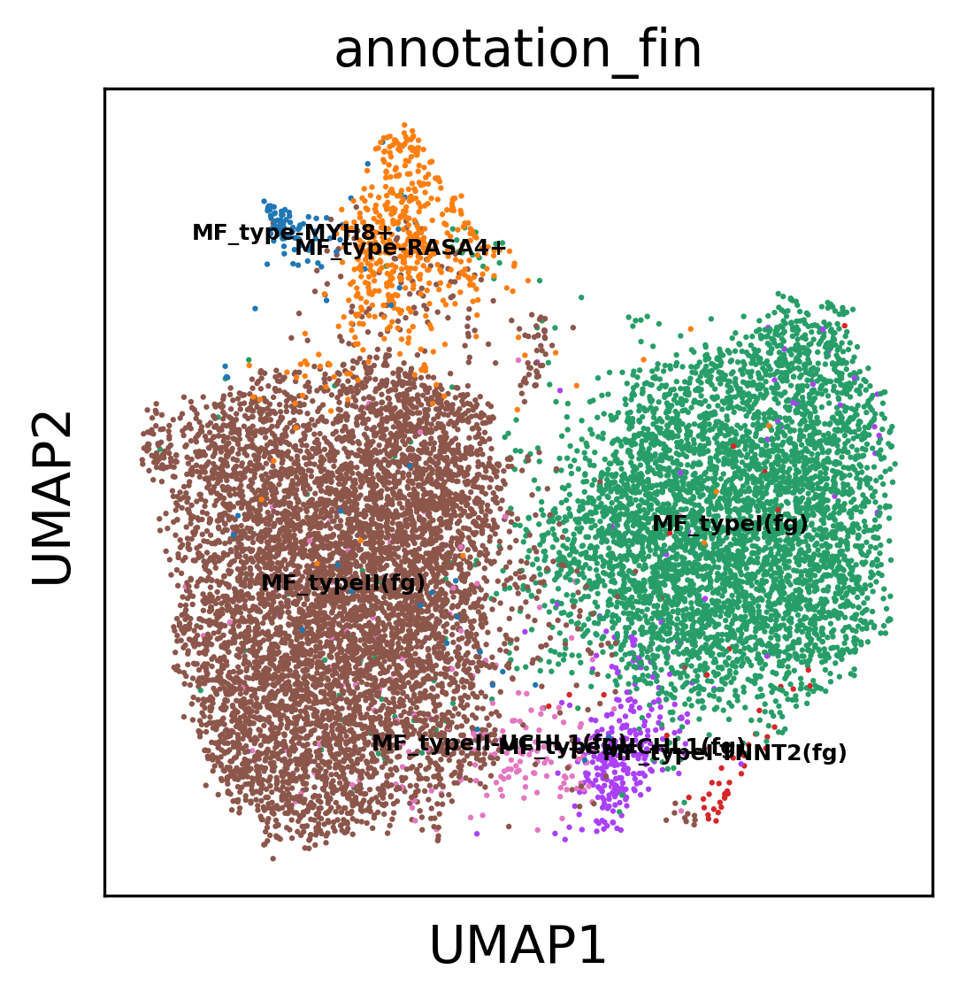

In [33]:
sc.pl.umap(adata, color = ['annotation_fin',],legend_loc='on data',legend_fontsize=6,save='ICM_MF_scvi_anno.pdf')

In [ ]:
# fraction

In [9]:
collections.Counter(adata.obs['annotation_fin'])

Counter({'MF_typeI(fg)': 4859,
         'MF_typeI-UCHL1(fg)': 298,
         'MF_typeI-TNNT2(fg)': 48,
         'MF_typeII-UCHL1(fg)': 190,
         'MF_typeII(fg)': 6885,
         'MF_type-MYH8+': 106,
         'MF_type-RASA4+': 510})

In [10]:
celltype_list = ['MF_typeI(fg)','MF_typeI-UCHL1(fg)','MF_typeI-TNNT2(fg)','MF_typeII(fg)','MF_typeII-UCHL1(fg)','MF_type-MYH8+','MF_type-RASA4+',]

In [15]:
fraction = []
cytokines_gene_list = ['ALDOA','DERA','FBP2','GPI','H6PD','PFKM','PGD','PGLS','PGM1','PRPS1','RBKS','RPE','RPIA','TALDO1','TKT','ALDH1L1','AMT','ATIC','DHFR','GART','MTFMT','MTHFD1','MTHFD1L','MTHFD2','MTHFD2L','MTHFR','MTHFS','MTR','SHMT1','SHMT2']
celltypes = []
gene = []
for celltype in celltype_list:
    for i in cytokines_gene_list:
        fraction.append(adata[adata.obs['annotation_fin']==celltype][adata[adata.obs['annotation_fin']==celltype].obs['Age_group']=='young'].raw[:,i].X.size/collections.Counter(adata[adata.obs['annotation_fin']==celltype].obs['Age_group'])['young'])
    gene = cytokines_gene_list*len(celltype_list)
    celltypes = celltypes+[celltype]*len(cytokines_gene_list)

fraction_df = pd.DataFrame({'SYMBOL' : gene,'fraction':fraction,'celltype':celltypes})
fraction_df

,SYMBOL,fraction,celltype
0,ALDOA,0.465791,MF_typeI(fg)
1,DERA,0.106427,MF_typeI(fg)
2,FBP2,0.102972,MF_typeI(fg)
3,GPI,0.154112,MF_typeI(fg)
4,H6PD,0.011057,MF_typeI(fg)
...,...,...,...
205,MTHFR,0.000000,MF_type-RASA4+
206,MTHFS,0.200000,MF_type-RASA4+
207,MTR,0.400000,MF_type-RASA4+
208,SHMT1,0.000000,MF_type-RASA4+


In [16]:
fraction_df.to_csv('/public/LiuTL/Rstudio/skeletal_muscle/DE_analysis_LMM_v3/data/ICM_MF_scvi_cytokines_fraction.csv')

In [12]:
adata.obs['Age_group']

mus_SNuc7468112-GCGAGAACAGTCAGCC     old
mus_SNuc7468112-CAAGAAATCGGCGCAT     old
mus_SNuc7468112-GCTGCGATCTTGGGTA     old
mus_SNuc7468112-CTCGGGACAGGTCGTC     old
mus_SNuc7468112-ACCAGTAAGAATAGGG     old
                                    ... 
WS_A_SKM10490128-CGTGATAGTGTGTGTT    old
WS_A_SKM10490128-AGTAACCAGGTGGTTG    old
WS_A_SKM10490128-CGGCAGTTCTCTCTTC    old
WS_A_SKM10490128-TACTTCACAAGAGAGA    old
WS_A_SKM10490128-TTCAATCGTGCATGTT    old
Name: Age_group, Length: 12896, dtype: category
Categories (2, object): ['old', 'young']